# Yelp Amenity Data cleaning and exploratory analysis

In [314]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [196]:
# phila bounds
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("data/Yelp API/census-tracts.geojson")

In [197]:
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)

In [118]:
neigh = phl_neigh_proj[["mapname", "geometry"]]

In [199]:
tract = phl_tract_proj[["neighborhood_name", "geometry"]]

## Read in amenity files

In [4]:
# amenities
restaurants = gpd.read_file("data/Yelp API/restaurants.geojson")
arts = gpd.read_file("data/Yelp API/arts.geojson")
beauty = gpd.read_file("data/Yelp API/beauty.geojson")
entertainment = gpd.read_file("data/Yelp API/entertainment.geojson")
kids = gpd.read_file("data/Yelp API/kids.geojson")
nightlife = gpd.read_file("data/Yelp API/nightlife.geojson")
outdoors = gpd.read_file("data/Yelp API/outdoors.geojson")
public_space = gpd.read_file("data/Yelp API/outdoors.geojson")
retail = gpd.read_file("data/Yelp API/retail.geojson")
shopping = gpd.read_file("data/Yelp API/shopping.geojson")
grocery = gpd.read_file("data/Yelp API/grocery.geojson")
education = gpd.read_file("data/Yelp API/education.geojson")

In [45]:
restaurants["type"] = "restaurant"
arts["type"] = "arts"
beauty["type"] = "beauty"
entertainment["type"] = "entertainment"
kids["type"] = "kids"
nightlife["type"] = "nightlife"
outdoors["type"] = "outdoors"
public_space["type"] = "public space"
retail["type"] = "retail"
shopping["type"] = "shopping"
grocery["type"] = "grocery"
education["type"] = "education"

In [46]:
# combine gdfs
amenities = gpd.GeoDataFrame(pd.concat([restaurants, arts, beauty, entertainment, kids, nightlife, outdoors, public_space, retail, shopping, grocery, education], ignore_index=True))

In [55]:
len(amenities)

17995

# Clip to Philadelphia boundaries

In [56]:
phl_bound_squeezed = phl_bound_proj.squeeze().geometry

# Amenity spatial patterns

In [117]:
amenities_phl = amenities.within(phl_bound_squeezed)
amenities_phl_gdf = amenities[amenities_phl]
amenities_phl_gdf.explore(tiles='CartoDB dark_matter', legend=True, column='type', cmap='Paired')

In [209]:
# count by type
amenities_grouped = amenities_phl_gdf.groupby('type').size().reset_index(name='count')

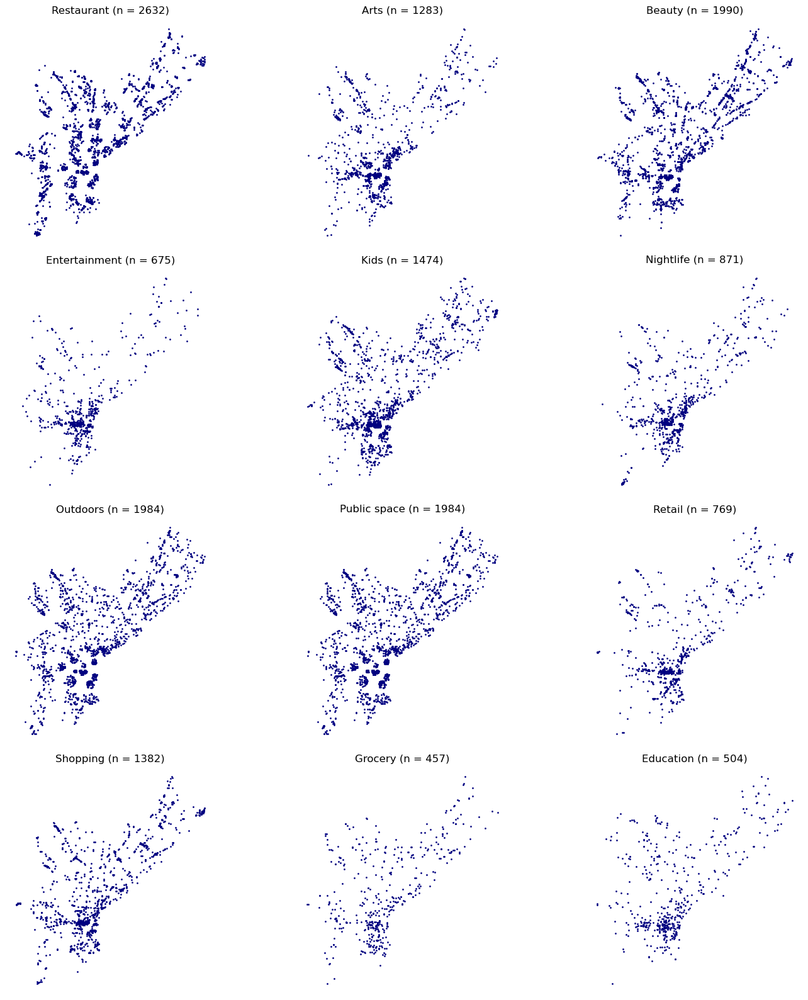

In [213]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Extract unique business types
business_types = amenities_phl_gdf['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenities_phl_gdf[amenities_phl_gdf['type'] == business_type]

    # Get count for the current business type
    count = amenities_grouped[amenities_grouped['type'] == business_type]['count'].values[0]

    # Plotting with transparency
    subset.plot(ax=axes[i], color='navy', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} (n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

In [214]:
amenities_phl_gdf["name"].nunique()

9005

# Data Validation

## Check duplicates

In [216]:
# Mark duplicates
duplicates = amenities_phl_gdf.duplicated(subset=['name', 'geometry'], keep=False)

# Create a DataFrame with only duplicates
duplicates_df = amenities_phl_gdf[duplicates]

duplicates_df

,name,rating,address,alias,title,geometry,type
4,Thunka Kitchen,4.0,5629 Chester Ave,african,African,POINT (2675970.967 230117.411),restaurant
5,Nafisa's Kitchen,5.0,5629 Chester Ave,"african, seafood, halal","African, Seafood, Halal",POINT (2675970.967 230117.411),restaurant
12,Fred's Water Ice,4.0,5343 Chester Ave,"icecream, foodstands","Ice Cream & Frozen Yogurt, Food Stands",POINT (2677068.301 231126.930),restaurant
15,Obsidian Eats,3.0,NaN,"comfortfood, foodtrucks, juicebars","Comfort Food, Food Trucks, Juice Bars & Smoothies",POINT (2675498.049 233270.817),restaurant
19,Atlas Pizza & Steaks,2.5,736 S 52nd St,"pizza, cheesesteaks","Pizza, Cheesesteaks",POINT (2675654.932 233814.640),restaurant
...,...,...,...,...,...,...,...
17937,BSD Education,5.0,1600 Vine St,specialtyschools,Specialty Schools,POINT (2692655.957 238123.643),education
17977,German Society of Pennsylvania,3.5,611 Spring Garden St,"language_schools, venues, landmarks","Language Schools, Venues & Event Spaces, Landm...",POINT (2697433.512 239615.589),education
17978,The Gun Range,4.0,542 N Percy St,"gun_ranges, firearmtraining","Gun/Rifle Ranges, Firearm Training",POINT (2696126.531 239786.051),education
17982,American Red Cross,2.5,700 Spring Garden St,"nonprofit, cprclasses, blooddonation","Community Service/Non-Profit, CPR Classes, Blo...",POINT (2697000.842 239245.684),education


# Neighborhoods and amenities

In [201]:
amenities_neigh = gpd.sjoin(amenities_phl_gdf, tract, how = "left", predicate = "intersects")

In [204]:
amenities_neigh_group = amenities_neigh.groupby(["neighborhood_name", "type"]).size().reset_index(name='count')
amenities_neigh_group_gdf = amenities_neigh_group.merge(phl_tract_proj, how = "left", on = "neighborhood_name")

In [205]:
amenities_neigh = gpd.GeoDataFrame(amenities_neigh_group_gdf, geometry='geometry')

In [206]:
amenities_nb = amenities_neigh[["neighborhood_name", "type", "count", "geometry"]]

In [207]:
amenities_nb[amenities_nb["type"] == "restaurant"].explore(tiles='CartoDB dark_matter', legend=True, column = "count", cmap = "magma")

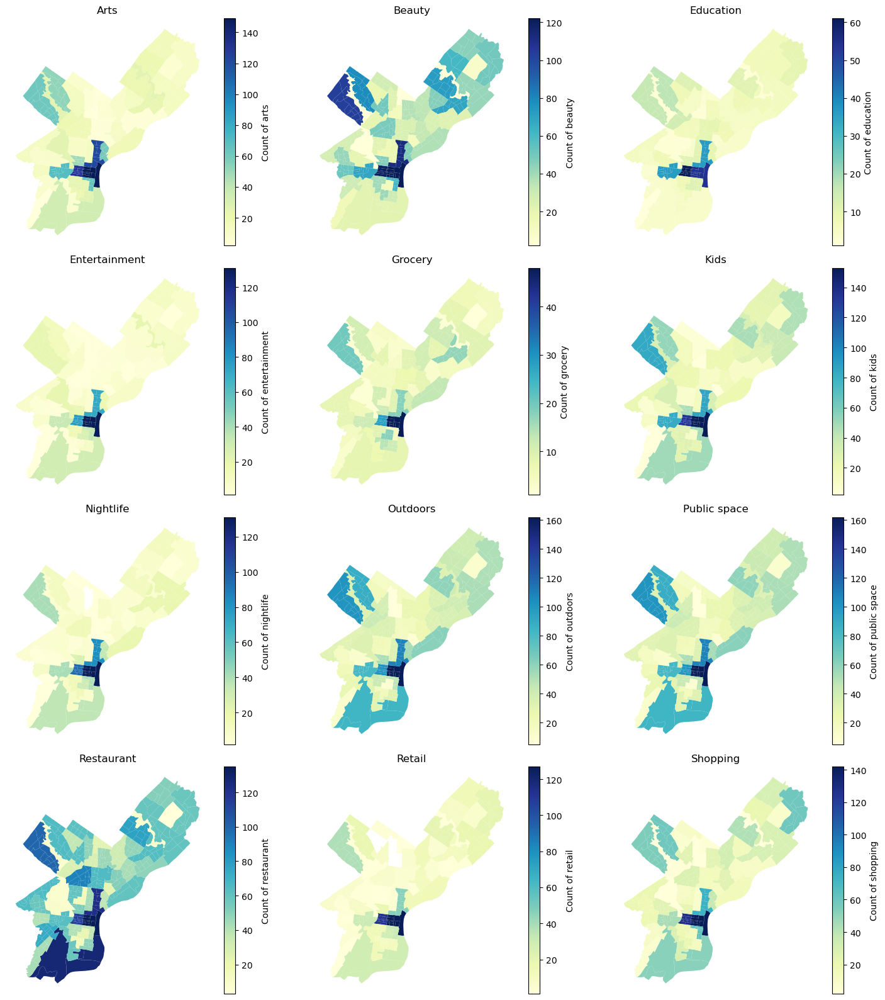

In [208]:
# Extract unique types
amenity_types = amenities_nb['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenities_nb[amenities_nb['type'] == amenity_type]

    # Plotting
    subset.plot(column='count', ax=axes[i], legend=True,
                legend_kwds={'label': "Count of " + amenity_type},
                cmap='YlGnBu')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

# Correlation analysis

In [243]:
# spreading the data
amenities_nb_wide = amenities_nb.pivot_table(index='neighborhood_name', columns='type', values='count', aggfunc=np.mean).fillna(0)

# Calculating the correlation matrix
correlation_matrix = amenities_nb_wide.corr()

In [242]:

import altair as alt

# Reset index to convert the index into a column for Altair
heatmap_data = correlation_matrix.reset_index().melt('type', var_name='type2', value_name='correlation')

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600)
chart

alt.LayerChart(...)

- Most are > 0.7
- most collinear vars: shopping, retail, outdoors/public space, nightlife, kids, entertainment, arts

## Check restaurant descriptions

In [280]:
# Filter and create a copy to avoid SettingWithCopyWarning
food_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "restaurant"].copy()

# Create a new column 'desc_1'
food_desc["desc_1"] = food_desc['alias'].str.split(',').str[0]
food_desc["desc_2"] = food_desc['alias'].str.split(',').str[1]
food_desc["desc_3"] = food_desc['alias'].str.split(',').str[2]

### First word in "alias"

In [284]:
# Group by 'desc_1' and count, then convert to DataFrame
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_1,count
107,pizza,316
36,chinese,193
117,restaurants,179
45,delis,158
123,seafood,100
17,breakfast_brunch,86
99,newamerican,81
77,hotdogs,81
58,fooddeliveryservices,75
121,sandwiches,75


### Second word in "alias"

In [303]:
# Group by 'desc_2' and count, then convert to DataFrame
food_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_2,count
111,sandwiches,117
12,breakfast_brunch,86
17,burgers,77
64,hotdogs,74
112,seafood,71
28,chicken_wings,64
131,tradamerican,64
72,italian,43
98,pizza,42
27,cheesesteaks,40


### Third word in "alias"

In [304]:
# Group by 'desc_3' and count, then convert to DataFrame
food_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_3,count
80,sandwiches,122
94,tradamerican,59
20,chicken_wings,40
49,hotdogs,37
10,breakfast_brunch,36
13,burgers,33
25,coffee,30
81,seafood,26
31,delis,26
79,salad,22


## Replace description 1 with description 2 when description 1 is irrelevant
Words like "restaurant" and "fooddeliveryservices" don't tell us what kind of food is served. Let's replace the description in these cases with something more descriptive. 

In these cases we can search for restaurants where the first word isn't descriptive, then replace the desc_1 with desc_2.

In [319]:
# Define the conditions
condition1 = food_desc['desc_1'].isin(["food trucks", "foodtrucks", "fooddeliveryservices", "delis", "bars", "grocery", "pubs", "catering", "convenience", "sportsbars", "popuprestaurants", "restaurants", "foodstands", "comfortfood", "food_court", "lounges", "breweries", "wine_bars", "bowling", "meats"])
condition2 = food_desc['desc_2'].notna()

# Update desc_1 where conditions are met
food_desc.loc[condition1 & condition2, 'desc_1'] = food_desc['desc_2']

food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head()

,desc_1,count
196,pizza,318
115,chinese,193
206,restaurants,107
212,seafood,103
93,breakfast_brunch,86


Unfortunately this didn't replace "restaurant". Restaurants with only "restaurants" as the first word in their alias usually don't have other descriptive words. This shows that "restaurant" is the default. This calls for another approach.

In [310]:
food_desc[food_desc["desc_1"] == "restaurants"].head(5)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
8,Smitty's Restaurant,0.0,5405 Chester Ave,restaurants,Restaurants,POINT (2676904.285 231029.670),restaurant,restaurants,NaN,NaN
10,Kan Yuen Ping,0.0,5428 Chester Ave,restaurants,Restaurants,POINT (2676791.167 230669.291),restaurant,restaurants,NaN,NaN
11,Silver Place,0.0,1500 S 58th St,restaurants,Restaurants,POINT (2673976.157 231063.740),restaurant,restaurants,NaN,NaN
14,Yuan East Restaurant,0.0,1832 S 58th St,restaurants,Restaurants,POINT (2675345.361 229583.321),restaurant,restaurants,NaN,NaN
17,Wei Hua,0.0,5140 Chester Ave,restaurants,Restaurants,POINT (2677863.415 231724.048),restaurant,restaurants,NaN,NaN


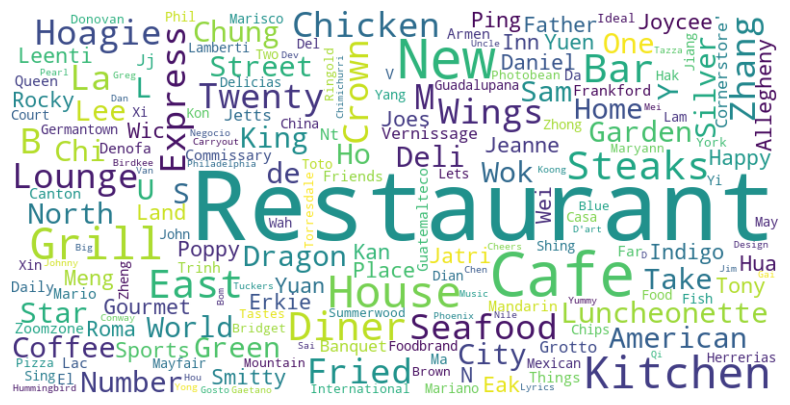

In [315]:
restaurant_cloud = food_desc[food_desc["desc_1"] == "restaurants"]

# Concatenate all text in the column
text = ' '.join(restaurant_cloud['name'].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [318]:
# List of keywords to search for
keywords = ["salad", "pizza", "grill", "sushi", "fried chicken", "pizzeria", "seafood", "BBQ", 
            "hoagie", "coffee", "diner", "luncheonette", "wings", "deli", "Mexican", "cafe", "steaks", 
            "wok", "lee", "american", "pizza", "china", "cafe", "zhang", "chung", "dragon", "meng", "xin", 
            "hua", "yi", "xi", "chicken", "ping", "yuen", "lam", "zhong", "guadalupana", "canton", "guatemalteco",
           "fish", "wei", "casa"]

# Function to find the first matching keyword in a string
def find_keyword(s, keywords):
    for keyword in keywords:
        if re.search(keyword, s, re.IGNORECASE):
            return keyword
    return None

# Apply the function to the 'name' column to create a temporary column
food_desc['temp_keyword'] = food_desc['name'].apply(lambda x: find_keyword(x, keywords))

# Define the condition where desc_2 is NA or NaN
condition_desc2_na = food_desc['desc_2'].isna()

# Update desc_2 where conditions are met
food_desc.loc[condition_desc2_na, 'desc_2'] = food_desc.loc[condition_desc2_na, 'temp_keyword']

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3,temp_keyword
0,Rodflash Smoked BBQ,0.0,,popuprestaurants,Pop-Up Restaurants,POINT (2676022.529 232162.402),restaurant,popuprestaurants,BBQ,NaN,BBQ
1,Gunpowder Cafe,3.0,NaN,"fooddeliveryservices, indpak, cafes","Food Delivery Services, Indian, Cafes",POINT (2676022.529 232162.402),restaurant,indpak,indpak,cafes,cafe
2,Lucky Chinese Restaurant,0.0,5541 Chester Ave,chinese,Chinese,POINT (2676286.873 230415.145),restaurant,chinese,None,NaN,None
3,J & J Restaurant,5.0,5513 Chester Ave,caribbean,Caribbean,POINT (2676518.230 230597.923),restaurant,caribbean,None,NaN,None
4,Thunka Kitchen,4.0,5629 Chester Ave,african,African,POINT (2675970.967 230117.411),restaurant,african,None,NaN,None
5,Nafisa's Kitchen,5.0,5629 Chester Ave,"african, seafood, halal","African, Seafood, Halal",POINT (2675970.967 230117.411),restaurant,african,seafood,halal,None
6,Jakes Place,3.0,5550 Chester Ave,breakfast_brunch,Breakfast & Brunch,POINT (2676342.330 230292.313),restaurant,breakfast_brunch,None,NaN,None
7,Chester Family Pizza,2.5,5504 Chester Ave,pizza,Pizza,POINT (2676648.905 230553.397),restaurant,pizza,pizza,NaN,pizza
8,Smitty's Restaurant,0.0,5405 Chester Ave,restaurants,Restaurants,POINT (2676904.285 231029.670),restaurant,restaurants,None,NaN,None
9,Nas Cafe,0.0,5405 Chester Ave,cafes,Cafes,POINT (2676904.285 231029.670),restaurant,cafes,cafe,NaN,cafe
